<a href="https://colab.research.google.com/github/PaulHeraty/StyleTransfer/blob/master/StyleTransfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
%matplotlib inline
import torch 
import torch.optim as optim
from torchvision import transforms, models
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

In [0]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
  param.requires_grad_(False)

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace)
  (18): MaxPool2d(kernel_size=2, stride=2, padding=0, 

In [0]:
def load_image(img_path, max_size=400, shape=None):
  image = Image.open(img_path).convert('RGB')
  if max(image.size) > max_size:
    size = max_size
  else:
    size = max(image.size)
    
  if shape is not None:
    size = shape
  
  in_transform = transforms.Compose([
      transforms.Resize(size),
      transforms.ToTensor(),
      transforms.Normalize((0.5, 0.5, 0.5),
                           (0.5, 0.5, 0.5))
  ])
  image = in_transform(image).unsqueeze(0)
  return image

In [0]:
content = load_image('City.jpg').to(device)
style = load_image('StarryNight.jpg', shape=content.shape[-2:]).to(device)

In [0]:
def im_convert(tensor):
  image = tensor.cpu().clone().detach().numpy()
  image = image.squeeze()
  image = image.transpose(1, 2, 0)
  image = image * np.array((0.5, 0.5, 0.5)) + np.array((0.5, 0.5, 0.5))
  image = image.clip(0, 1)
  return image

(-0.5, 599.5, 399.5, -0.5)

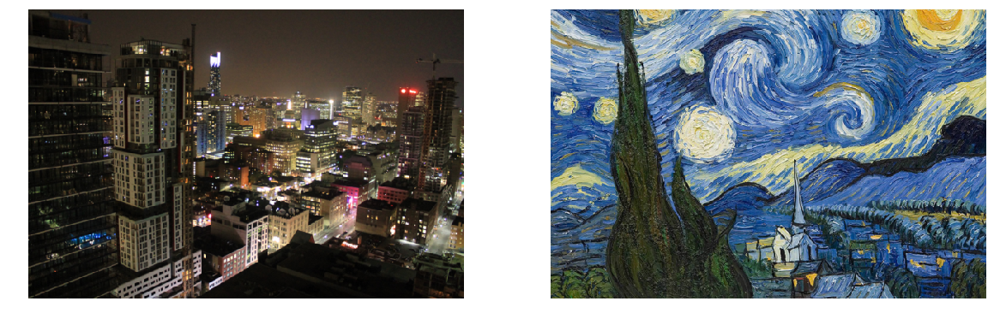

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(content))
ax1.axis('off')
ax2.imshow(im_convert(style))
ax2.axis('off')

In [0]:
def get_features(image, model):
  layers = {'0': 'conv1_1',
            '5': 'conv2_1',
           '10': 'conv3_1',
           '19': 'conv4_1',
           '21': 'conv4_2', # content extraction
           '28': 'conv5_1'}
  features = {}
  
  for name, layer in model._modules.items():
    image = layer(image)
    if name in layers:
      features[layers[name]] = image
  return features

In [0]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

In [0]:
def gram_matrix(tensor):
  _, d, h, w = tensor.size()
  tensor = tensor.view(d, h*w)
  gram = torch.mm(tensor, tensor.t())
  return gram

In [0]:
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

In [0]:
style_weights = {'conv1_1': 1.0,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2
                 }
content_weight = 1.0
style_weight = 1e6

In [0]:
target = content.clone().requires_grad_(True).to(device)

In [0]:
show_every = 300
optimizer = optim.Adam([target], lr=0.003)
steps = 10000

height, width, channels = im_convert(target).shape
capture_frame = int(steps / 300)
image_array = np.empty(shape=(int(steps/capture_frame), height, width, channels))
counter = 0

Total loss:  2887821.0
Iteration:  300


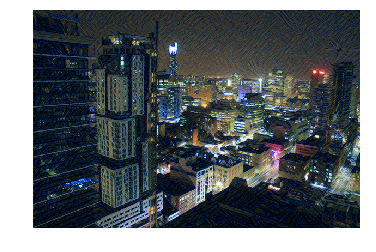

Total loss:  949966.375
Iteration:  600


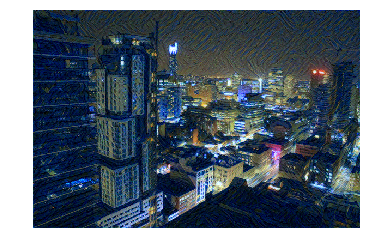

Total loss:  658588.5
Iteration:  900


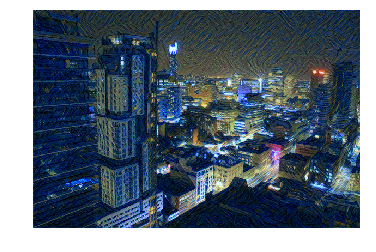

Total loss:  510585.15625
Iteration:  1200


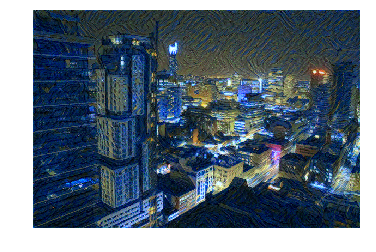

Total loss:  400834.15625
Iteration:  1500


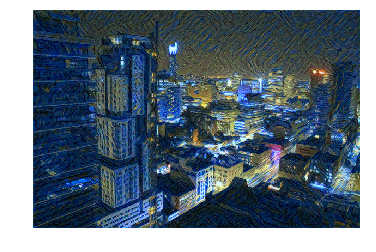

Total loss:  315072.5625
Iteration:  1800


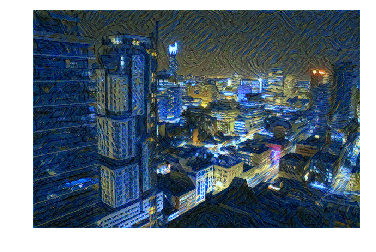

Total loss:  247036.15625
Iteration:  2100


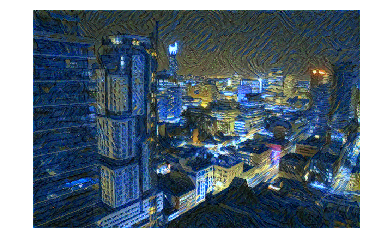

Total loss:  192746.859375
Iteration:  2400


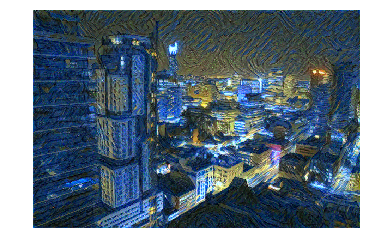

Total loss:  149561.671875
Iteration:  2700


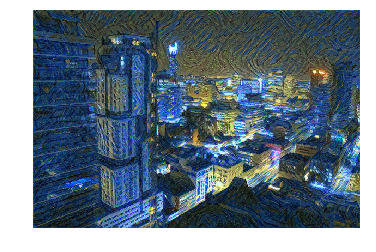

Total loss:  115443.4765625
Iteration:  3000


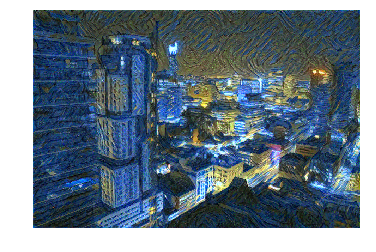

Total loss:  88834.0390625
Iteration:  3300


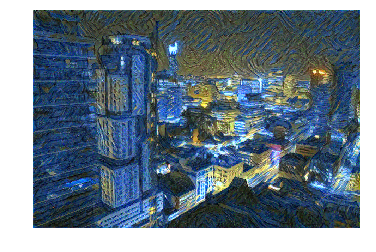

Total loss:  68444.8984375
Iteration:  3600


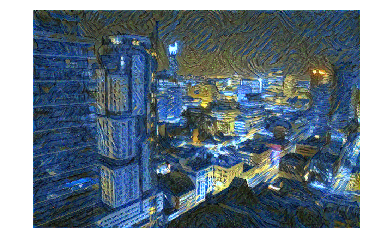

Total loss:  53123.8671875
Iteration:  3900


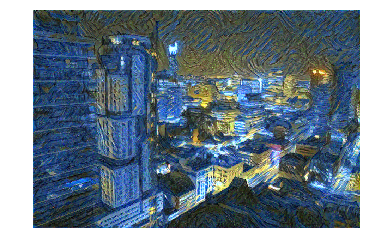

Total loss:  41849.62109375
Iteration:  4200


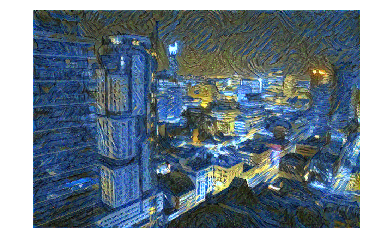

Total loss:  33680.65234375
Iteration:  4500


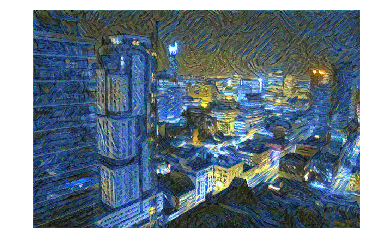

Total loss:  27807.1953125
Iteration:  4800


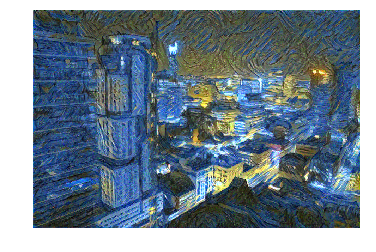

Total loss:  23562.19921875
Iteration:  5100


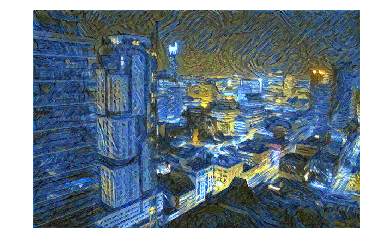

Total loss:  20475.236328125
Iteration:  5400


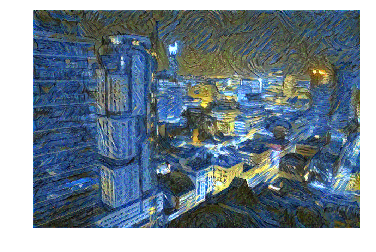

Total loss:  18328.5078125
Iteration:  5700


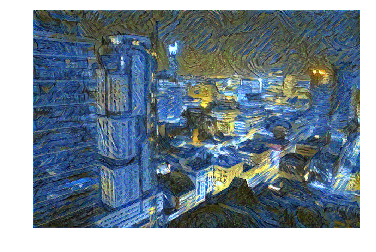

Total loss:  16621.6796875
Iteration:  6000


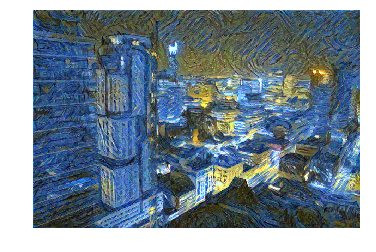

Total loss:  15270.5693359375
Iteration:  6300


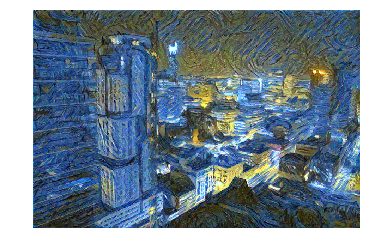

Total loss:  14227.8798828125
Iteration:  6600


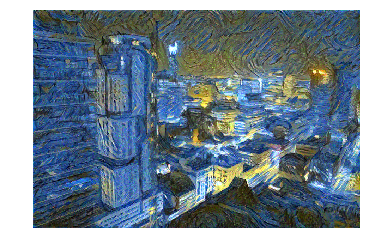

Total loss:  13477.85546875
Iteration:  6900


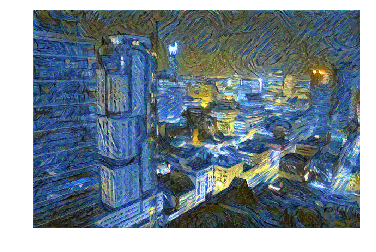

Total loss:  12725.7470703125
Iteration:  7200


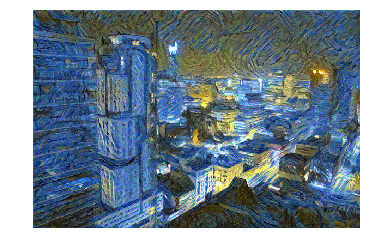

Total loss:  12705.984375
Iteration:  7500


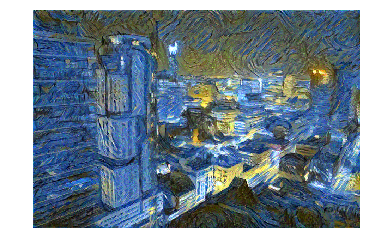

Total loss:  11683.3935546875
Iteration:  7800


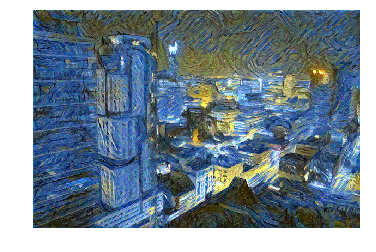

Total loss:  11253.962890625
Iteration:  8100


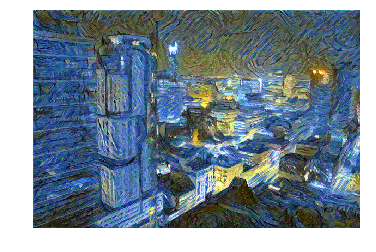

Total loss:  11046.6455078125
Iteration:  8400


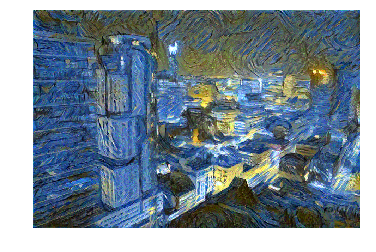

Total loss:  10594.6923828125
Iteration:  8700


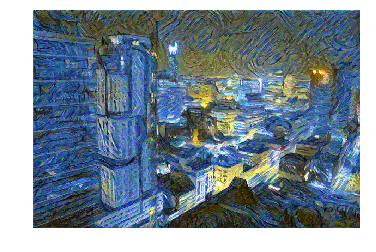

Total loss:  10364.4033203125
Iteration:  9000


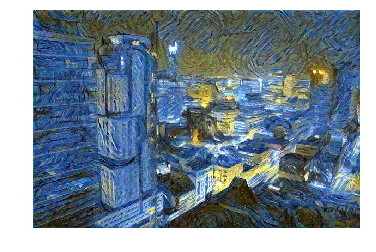

Total loss:  10844.0380859375
Iteration:  9300


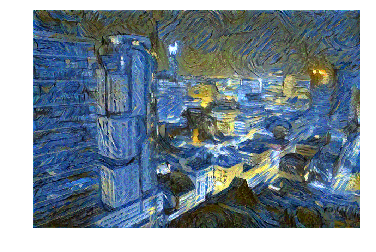

Total loss:  10051.845703125
Iteration:  9600


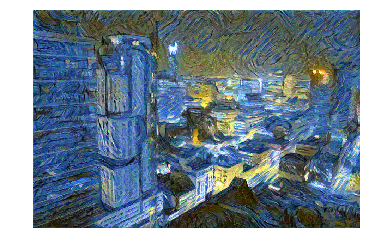

Total loss:  9940.93359375
Iteration:  9900


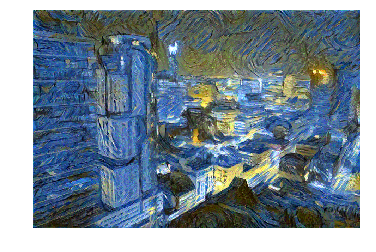

In [15]:
for ii in range(1, steps+1):
  target_features = get_features(target, vgg)
  content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)
  style_loss = 0
  
  for layer in style_weights:
    target_feature = target_features[layer]
    target_gram = gram_matrix(target_feature)
    style_gram = style_grams[layer]
    layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
    _, d, h, w = target_feature.shape
    style_loss += layer_style_loss/(d*h*w)
    
  total_loss = (content_weight * content_loss) + (style_weight * style_loss)
  
  optimizer.zero_grad()
  total_loss.backward()
  optimizer.step()
  
  if ii % show_every == 0:
    print('Total loss: ', total_loss.item())
    print('Iteration: ', ii)
    plt.imshow(im_convert(target))
    plt.axis('off')
    plt.show()
    
  if ii % capture_frame == 0:
    image_array[counter] = im_convert(target)
    counter += 1

(-0.5, 599.5, 399.5, -0.5)

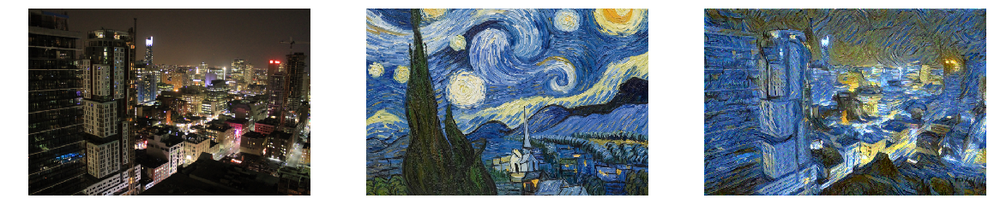

In [16]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20,10))
ax1.imshow(im_convert(content))
ax1.axis('off')
ax2.imshow(im_convert(style))
ax2.axis('off')
ax3.imshow(im_convert(target))
ax3.axis('off')

In [0]:
import cv2

frame_height, frame_width, _ = im_convert(target).shape
vid = cv2.VideoWriter('output.mp4', cv2.VideoWriter_fourcc(* 'XVID'), 30, (frame_width, frame_height))

for i in range(0, 300):
  img = image_array[i]
  img = img*255
  img = np.array(img, dtype=np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  vid.write(img)

vid.release()

In [21]:
ls

City.jpg  MonaLisa.jpg  output.mp4  sample_data/  StarryNight.jpg


In [0]:
from google.colab import files

files.download('output.mp4')